In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
%pylab inline
import tensorflow_datasets as tfds
from nsec.datasets.massivenu import MassiveNu
import tensorflow as tf

Populating the interactive namespace from numpy and matplotlib


In [3]:
delta=0.25

def preprocessing_fn(im):
    im = tf.image.random_crop(tf.expand_dims(im['map'],-1), [320,320,1])
    im = tf.image.random_flip_left_right(im)
    im = tf.image.random_flip_up_down(im)
    s = delta * tf.random.normal([1,1,1], mean=0.0, stddev=delta)
    u = tf.random.normal([320,320,1])
    x = im + s * u
    return {'x':x, 'y':im, 's':s, 'u':u}

In [4]:
dataset = tfds.load(name="massive_nu", split="train")
dataset = dataset.repeat()
dataset = dataset.map(preprocessing_fn)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(32)

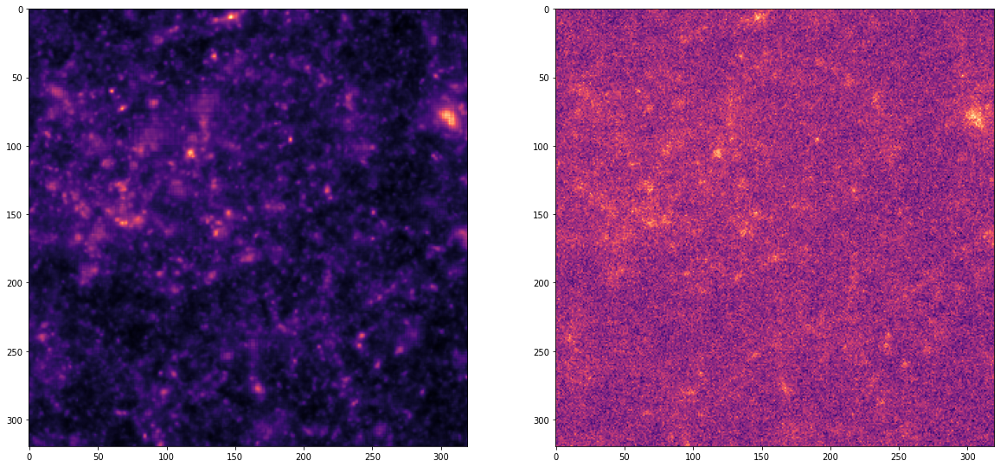

In [5]:
figure(figsize=(20,10))
for example in dataset.take(1):  # Only take a single example
  subplot(121)
  imshow(example['y'][0],cmap='magma')
  subplot(122)
  imshow(example['x'][0],cmap='magma')

In [6]:
from nsec.models.dae.convdae import SmallUResNet, UResNet
from jax.experimental import optix
import jax.numpy as jnp
from nsec.normalization import SNParamsTree as CustomSNParamsTree

In [7]:
import jax
import jax.numpy as jnp
import haiku as hk

import types
from typing import Mapping, Optional, Sequence, Union


class MediumUResNet(UResNet):
  """ResNet18."""

  def __init__(self,
               bn_config: Optional[Mapping[str, float]] = None,
               name: Optional[str] = None):
    """Constructs a ResNet model.
    Args:
      bn_config: A dictionary of two elements, ``decay_rate`` and ``eps`` to be
        passed on to the :class:`~haiku.BatchNorm` layers.
      resnet_v2: Whether to use the v1 or v2 ResNet implementation. Defaults
        to ``False``.
      name: Name of the module.
    """
    super().__init__(blocks_per_group=(2, 2, 2, 2),
                     bn_config=bn_config,
                     bottleneck=False,
                     channels_per_group=(32, 64, 128, 128),
                     use_projection=(True, True, True, True),
                     name=name)

In [8]:
def forward(x, s, is_training=False):
    denoiser = MediumUResNet()
    return denoiser(x, s, is_training=is_training)

model = hk.transform_with_state(forward)

In [9]:
optimizer = optix.adam(1e-3)
rng_seq = hk.PRNGSequence(42)
import jax 

In [10]:
params, state = model.init(next(rng_seq), jnp.zeros((1, 320, 320, 1)), jnp.zeros((1, 1, 1, 1)), is_training=True)
opt_state = optimizer.init(params)

RuntimeError: Internal: Unable to launch convolution with type forward and algorithm (0, none)

In [11]:
@jax.jit
def loss_fn(params, state, rng_key, batch):
    res, state = model.apply(params, state, rng_key, batch['x'], batch['s'], is_training=True)
    loss = jnp.mean((batch['u'] + batch['s'] * res)**2)
    return loss, state

In [12]:
@jax.jit
def update(params, state, rng_key, opt_state, batch):
    (loss, state), grads = jax.value_and_grad(loss_fn, has_aux=True)(params, state, rng_key, batch)
    updates, new_opt_state = optimizer.update(grads, opt_state)
    new_params = optix.apply_updates(params, updates)
    return loss, new_params, state, new_opt_state

In [14]:
losses = []

In [ ]:
for step, batch in enumerate(dataset):
    batch = {k:batch[k].numpy() for k in batch.keys()}
    loss, params, state, opt_state = update(params, state, next(rng_seq), opt_state, batch)
    losses.append(loss)
    if step%100==0:
        print(step, loss)

0 0.067293644
100 0.07996784
200 0.06838444
300 0.10205425
400 0.09319163
500 0.08368898
600 0.09061327
700 0.11105146
800 0.08599225
900 0.10694682
1000 0.07644444
1100 0.13916285
1200 0.111662775
1300 0.067049704
1400 0.08258329
1500 0.070130475
1600 0.107666455
1700 0.069576964
1800 0.11088523
1900 0.059309483
2000 0.08510348
2100 0.08851197
2200 0.106744766
2300 0.05583074
2400 0.06460859
2500 0.05862458
2600 0.06407162
2700 0.08603719
2800 0.0572959
2900 0.05839233
3000 0.102753066
3100 0.0918445
3200 0.0670283
3300 0.08182731
3400 0.070843436
3500 0.08362112
3600 0.0866593
3700 0.09504568
3800 0.0874188
3900 0.074468315
4000 0.089760885
4100 0.06103412
4200 0.1283075
4300 0.16603364
4400 0.096844316
4500 0.047868714
4600 0.10960866
4700 0.08041215
4800 0.059201155
4900 0.055224564
5000 0.04669908
5100 0.10427759
5200 0.058388114
5300 0.08964403
5400 0.069590926
5500 0.056235485
5600 0.057269868
5700 0.056710195
5800 0.078345075
5900 0.07748644
6000 0.1448856
6100 0.06584007
6200 

In [9]:
# Saving params
import pickle

# with open('lensing-conv-dae-noreg.pckl', 'wb') as file:
#     pickle.dump([params, state], file)

In [10]:
# Importing saved model
with open('lensing-conv-dae-noreg.pckl', 'rb') as file:
    params, state = pickle.load(file)

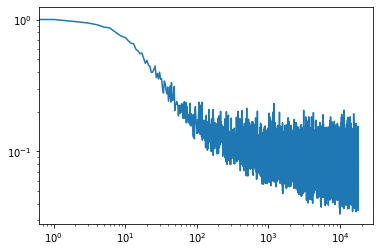

In [25]:
loglog(losses)

In [13]:
from functools import partial
score = partial(model.apply, params, state, next(rng_seq))

In [14]:
for batch in dataset.take(1):
    batch = {k:batch[k].numpy() for k in batch.keys()}
    res, state = score(batch['x'],batch['s'], is_training=False)

RuntimeError: Internal: Unable to launch convolution with type forward and algorithm (0, none)

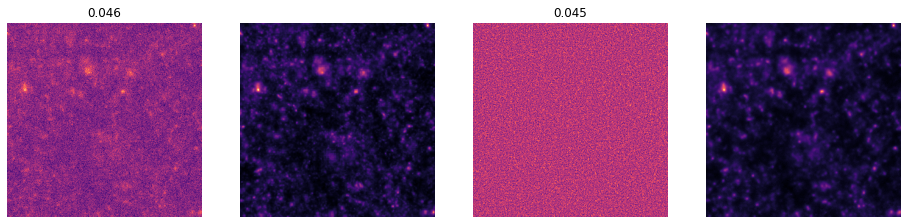

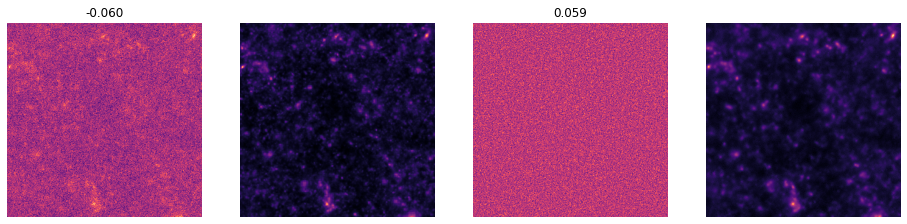

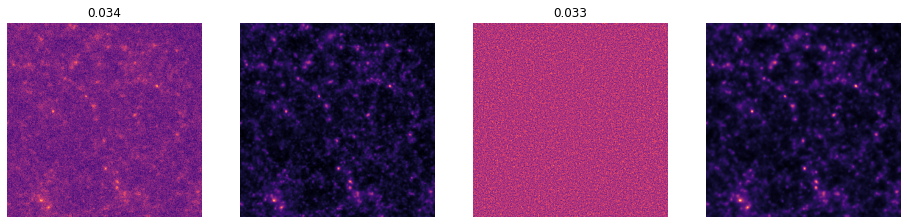

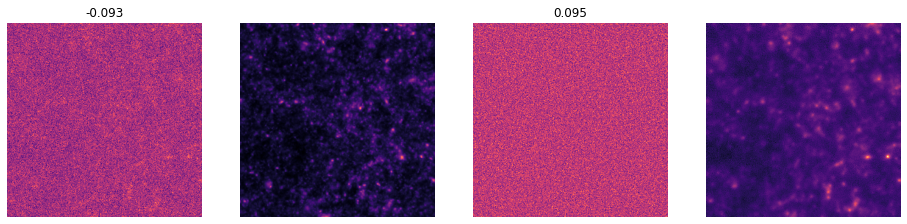

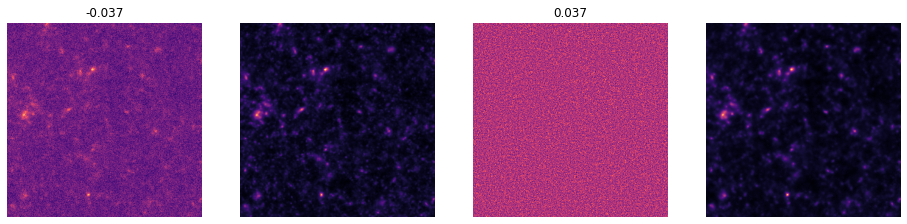

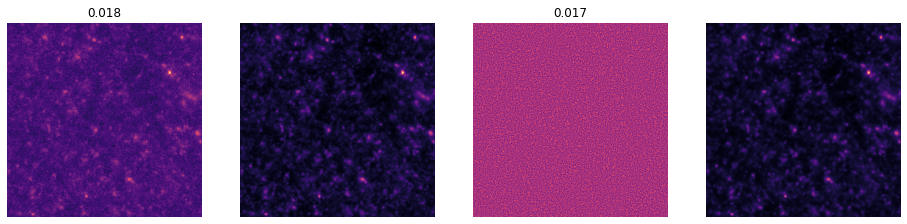

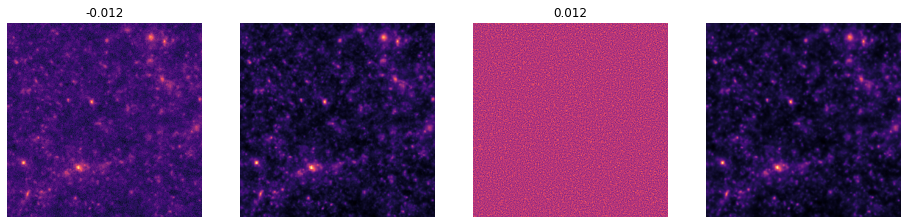

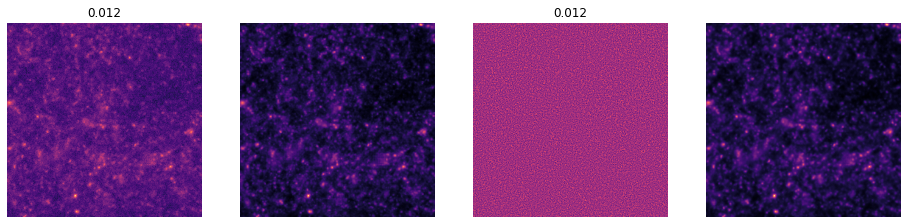

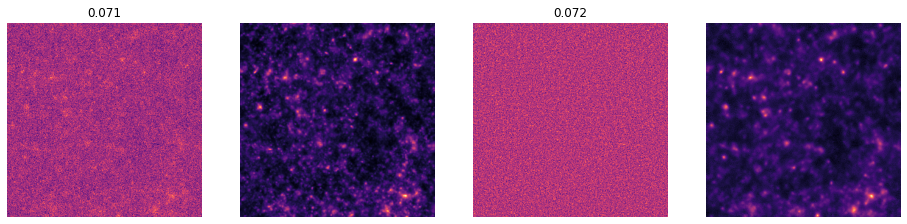

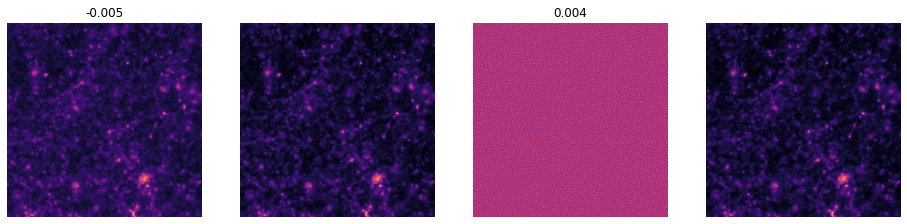

In [28]:
for i in range(10):
  ind = i
  figure(figsize=(16,4))
  subplot(141)
  title("%0.3f"%batch['s'][ind,0,0,0])
  imshow(batch['x'][ind,...,0],cmap='magma')
  axis('off')
  subplot(142)
  imshow(batch['y'][ind,...,0],cmap='magma')
  axis('off')
  subplot(143)
  imshow(res[ind,...,0],cmap='magma')
  axis('off')
  title("%0.3f"%std(batch['s'][ind,:,:,0]**2 *res[ind,...,0]))
  subplot(144)
  imshow(batch['x'][ind,...,0] + batch['s'][ind,:,:,0]**2 * res[ind,...,0],cmap='magma')
  axis('off')

In [29]:
# Trying to sample from the model
from nsec.samplers import ScoreHamiltonianMonteCarlo, ScoreMetropolisAdjustedLangevinAlgorithm

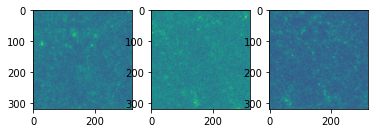

In [31]:
subplot(131)
imshow(batch['x'][0,...,0].reshape((320,320,)))
subplot(132)
imshow(batch['x'][1,...,0].reshape((320,320,)))
subplot(133)
imshow(batch['x'][2,...,0].reshape((320,320,)))

In [32]:
import jax
import jax.numpy as jnp
import tensorflow_probability as tfp; tfp = tfp.experimental.substrates.jax

def score_fn(x):
    return score(x.reshape((1,320,320,1)), jnp.zeros((1,1,1,1))+1e-2, is_training=False)[0].reshape((320*320,))

In [89]:
num_results = int(1e4)
num_burnin_steps = int(1e1)

In [90]:
@jax.jit
def get_samples():
    # First running SHMC
    kernel_shmc = ScoreHamiltonianMonteCarlo(
            target_score_fn=score_fn,
            num_leapfrog_steps=4,
            num_delta_logp_steps=4,
            step_size=0.001)
 
    samples_shmc, is_accepted_shmc = tfp.mcmc.sample_chain(
          num_results=num_results,
          num_burnin_steps=num_burnin_steps,
          current_state= batch['x'][0,...,0].reshape((320*320,)),#0.5*randn(32,32).reshape((32*32,)).astype('float32'),#
          kernel=kernel_shmc,
          trace_fn=lambda _, pkr: pkr.is_accepted, 
          seed=jax.random.PRNGKey(1))
    return samples_shmc, is_accepted_shmc 
 
samples_shmc, is_accepted_shmc = get_samples()

(1, 160, 160, 32)
(1, 160, 160, 32)
(1, 80, 80, 64)
(1, 40, 40, 128)
(1, 20, 20, 256)
(1, 40, 40, 256)
(1, 80, 80, 192)
(1, 160, 160, 96)
(1, 160, 160, 64)
(1, 160, 160, 32)
(1, 160, 160, 32)
(1, 80, 80, 64)
(1, 40, 40, 128)
(1, 20, 20, 256)
(1, 40, 40, 256)
(1, 80, 80, 192)
(1, 160, 160, 96)
(1, 160, 160, 64)
(1, 160, 160, 32)
(1, 160, 160, 32)
(1, 80, 80, 64)
(1, 40, 40, 128)
(1, 20, 20, 256)
(1, 40, 40, 256)
(1, 80, 80, 192)
(1, 160, 160, 96)
(1, 160, 160, 64)


RuntimeError: Resource exhausted: Out of memory while trying to allocate 4096000000 bytes.

In [77]:
samples_shmc = samples_shmc[where(is_accepted_shmc)[0]]

In [64]:
len(where(is_accepted_shmc)[0])

6349

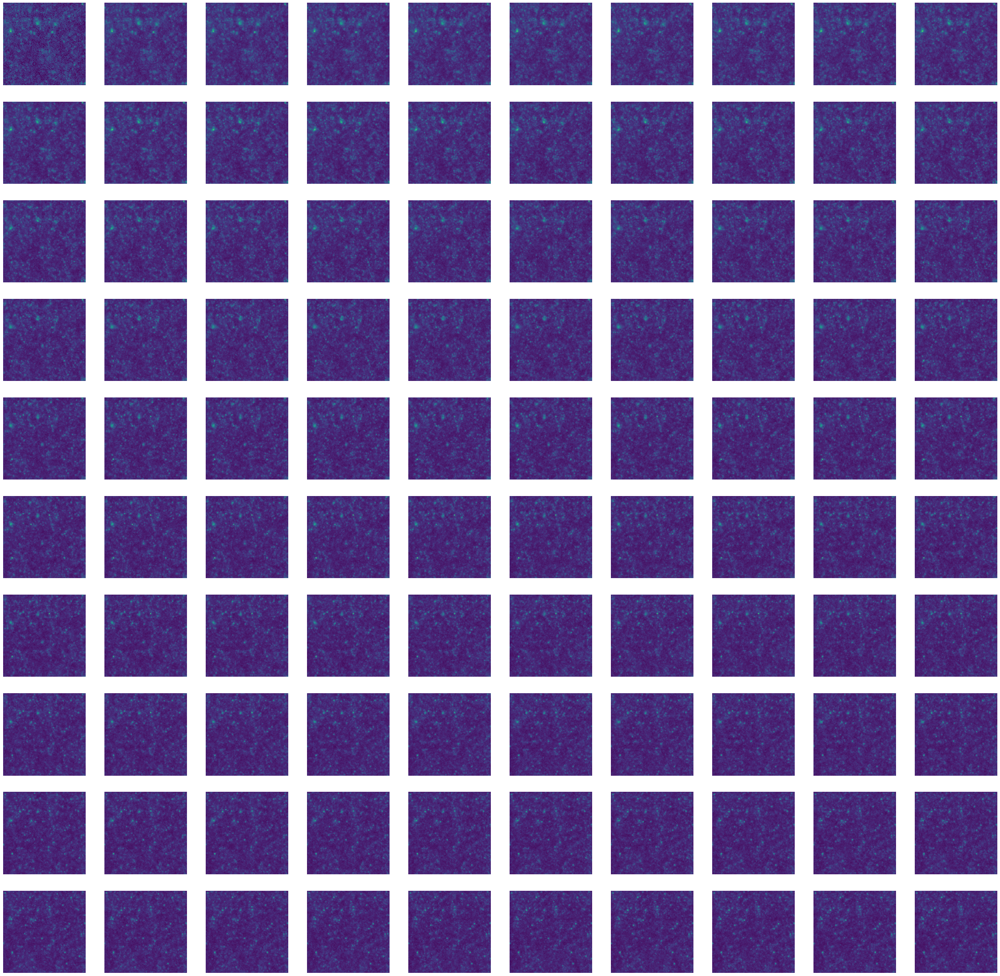

In [84]:
figure(figsize=(40,40))
for i in range(10):
  for j in range(10):
    subplot(10,10,10*i+j+1)
    imshow(samples_shmc[(10*i+j)*60].reshape((320,320)),vmin=-0.05,vmax=0.3)
    axis('off')

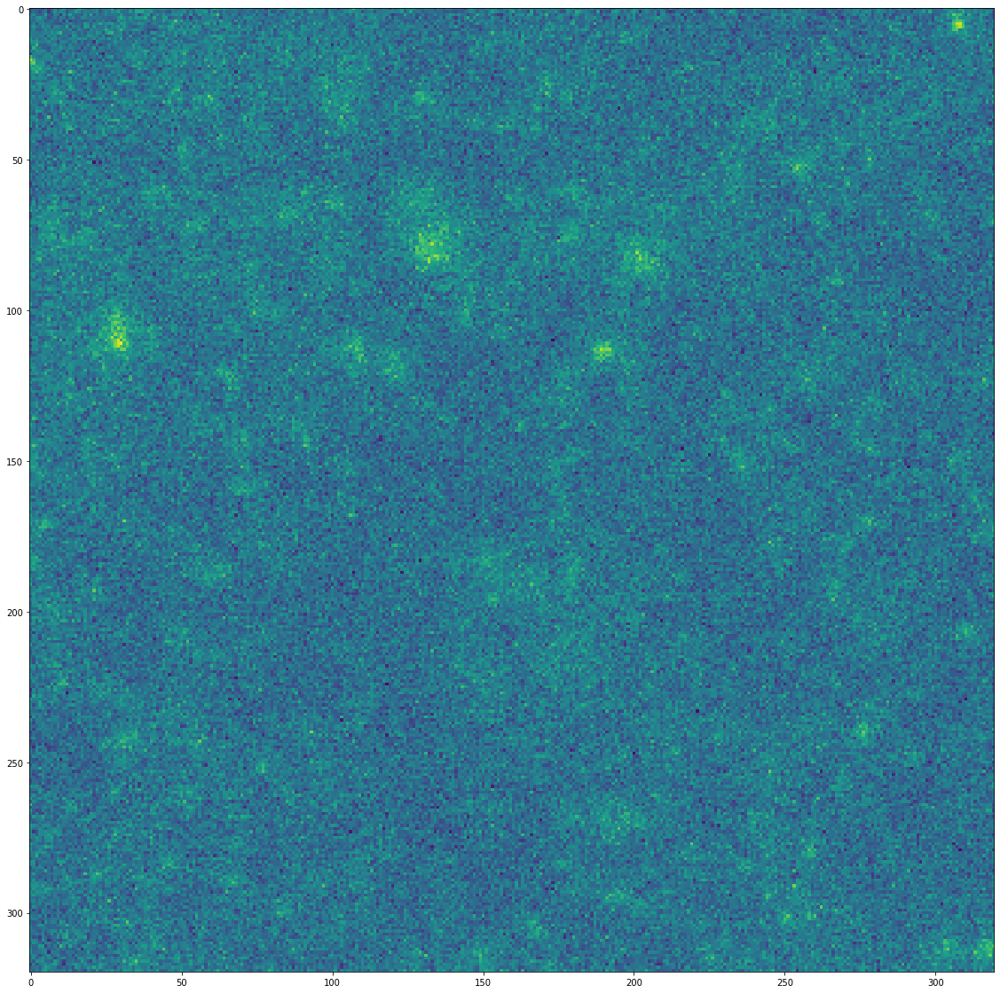

In [67]:
figure(figsize=(20,20))
imshow(batch['x'][0].reshape((320,320)))

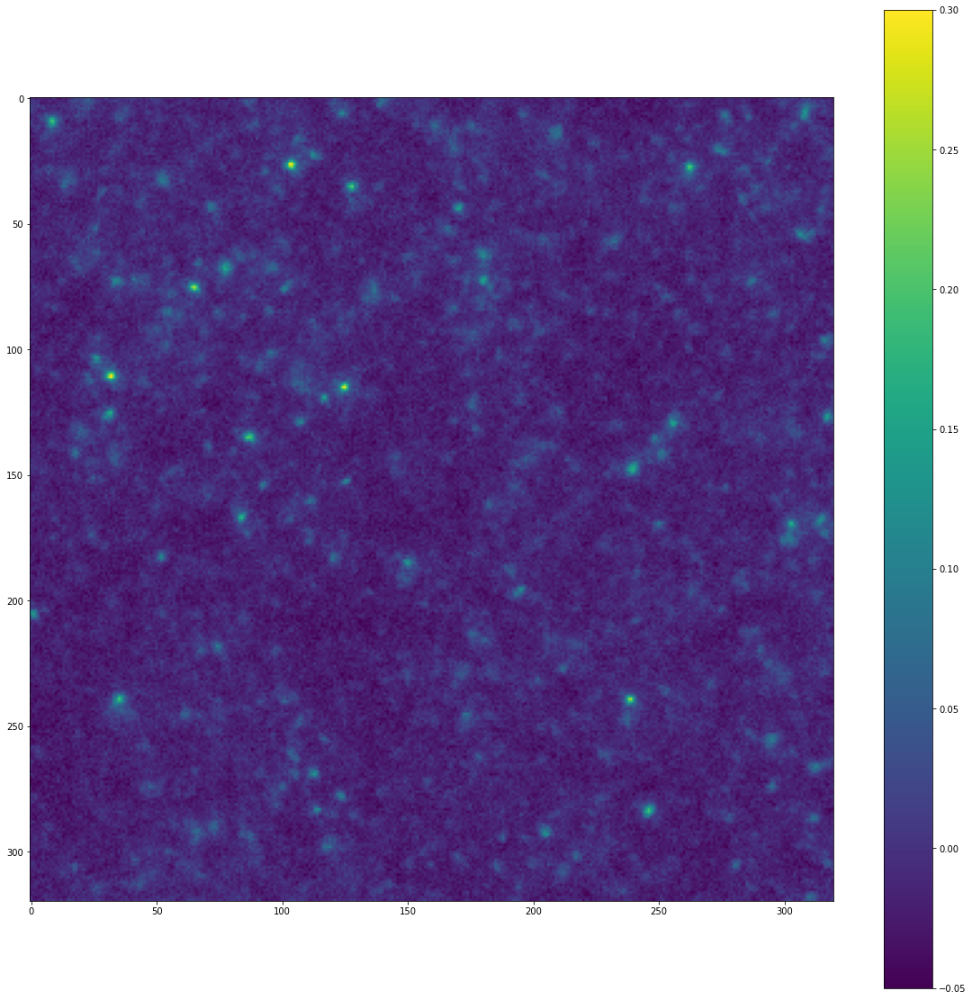

In [82]:
figure(figsize=(20,20))
imshow(samples_shmc[-1].reshape((320,320)),vmin=-0.05,vmax=0.3);colorbar()

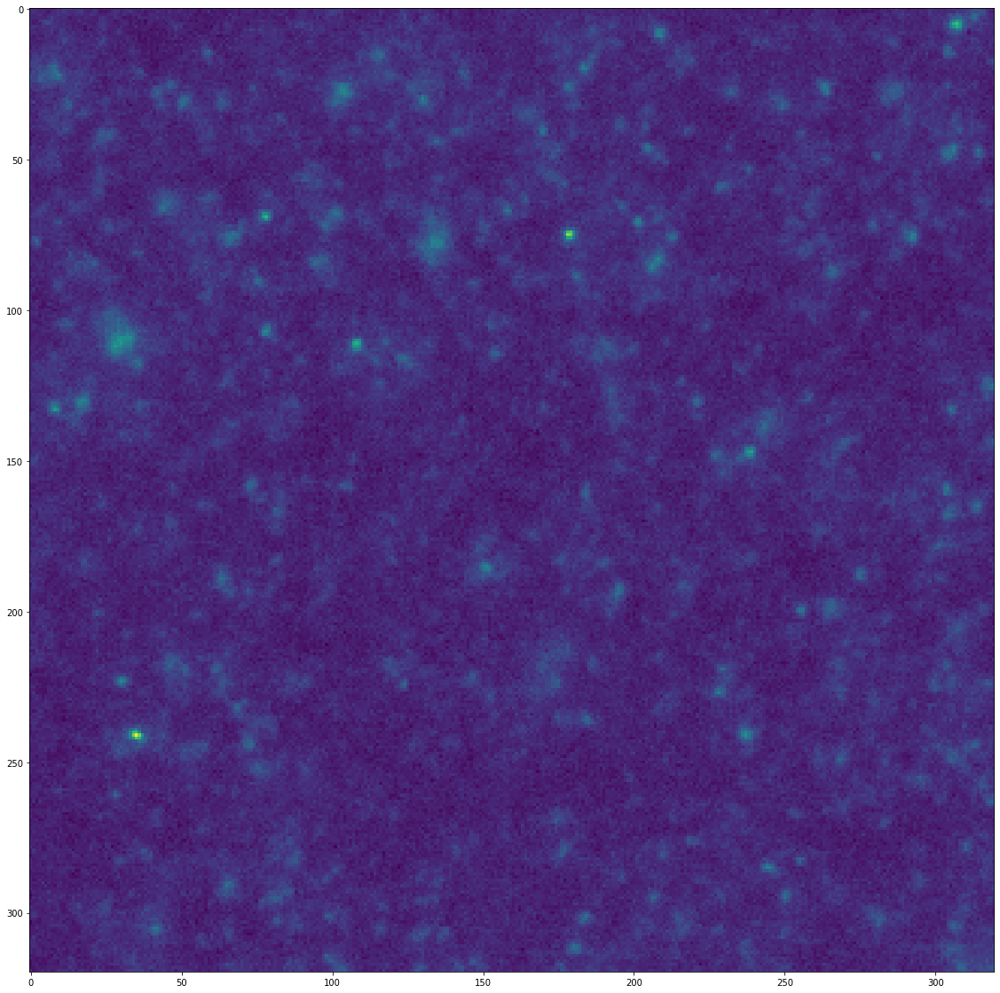

In [75]:
figure(figsize=(20,20))
imshow(samples_shmc[5000].reshape((320,320)))

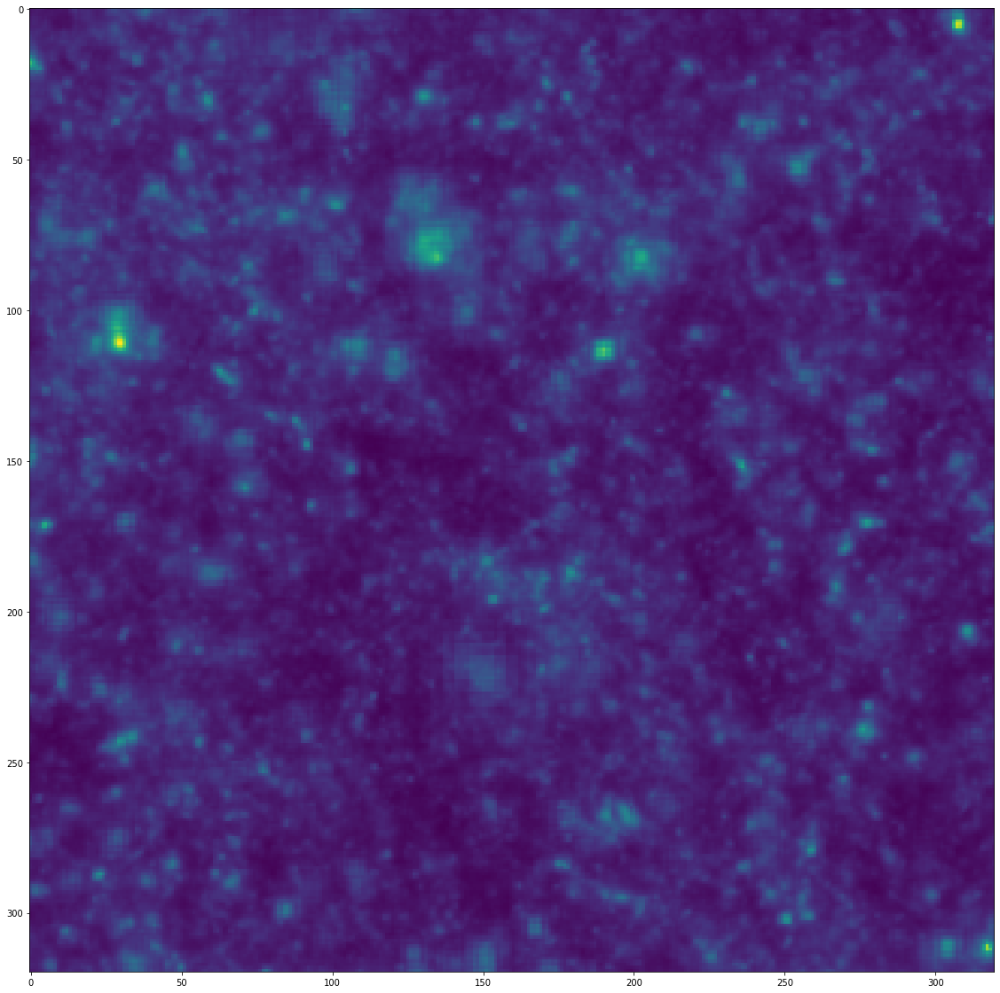

In [69]:
figure(figsize=(20,20))
imshow(batch['y'][0].reshape((320,320)))